# Number of COVID-19 Cases as a Function of Country Population

- number of **new** COVID-19 cases daily report downloaded Apr 5, 2020 from [Europa site](https://www.ecdc.europa.eu/en/publications-data/download-todays-data-geographic-distribution-covid-19-cases-worldwide)
- world population numbers downloaded from [UN](https://population.un.org/wpp/Download/Standard/CSV/)

## population data first

In [8]:
import pandas as pd
fname = "./WPP2019_TotalPopulationBySex.csv"

popdf = pd.read_csv(fname)
popdf

,LocID,Location,VarID,Variant,Time,MidPeriod,PopMale,PopFemale,PopTotal,PopDensity
0,4,Afghanistan,2,Medium,1950,1950.5,4099.243,3652.874,7752.117,11.874
1,4,Afghanistan,2,Medium,1951,1951.5,4134.756,3705.395,7840.151,12.009
2,4,Afghanistan,2,Medium,1952,1952.5,4174.450,3761.546,7935.996,12.156
3,4,Afghanistan,2,Medium,1953,1953.5,4218.336,3821.348,8039.684,12.315
4,4,Afghanistan,2,Medium,1954,1954.5,4266.484,3884.832,8151.316,12.486
...,...,...,...,...,...,...,...,...,...,...
280927,716,Zimbabwe,207,Lower 95 PI,2080,2080.5,10576.533,11255.983,21836.893,56.448
280928,716,Zimbabwe,207,Lower 95 PI,2085,2085.5,10293.349,11050.875,21355.988,55.205
280929,716,Zimbabwe,207,Lower 95 PI,2090,2090.5,9920.336,10767.709,20689.956,53.483
280930,716,Zimbabwe,207,Lower 95 PI,2095,2095.5,9503.711,10412.184,19892.080,51.421


### Key Notes

1. Population values are in thousands
2. Locations include regions as well as countries
3. Time periods mix projections with real data. Data does not make it obvious which are projections and which are real census values.
4. There are multiple rows for (Location, Time) pair which denote different types of projections

In [88]:
pd.set_option('display.max_rows', 200)

In [9]:
# these are the projection types
popdf.Variant.unique()

array(['Medium', 'High', 'Low', 'Constant fertility',
       'Instant replacement', 'Zero migration', 'Constant mortality',
       'No change', 'Momentum', 'Median PI', 'Upper 80 PI', 'Lower 80 PI',
       'Upper 95 PI', 'Lower 95 PI'], dtype=object)

In [10]:
popdf.dtypes

LocID           int64
Location       object
VarID           int64
Variant        object
Time            int64
MidPeriod     float64
PopMale       float64
PopFemale     float64
PopTotal      float64
PopDensity    float64
dtype: object

In [24]:
x = popdf[['LocID', 'Location']]
x = x.drop_duplicates().sort_values(by='LocID')
x

,LocID,Location
0,4,Afghanistan
2976,8,Albania
3860,12,Algeria
4744,16,American Samoa
5779,20,Andorra
6663,24,Angola
8431,28,Antigua and Barbuda
15956,31,Azerbaijan
9315,32,Argentina
13304,36,Australia


In [25]:
x[x.Location == 'World']

,LocID,Location
277245,900,World


In [22]:
# anything below this loc_id denotes larger regions
last_country_loc_id = 894

In [23]:
# read population data first

import csv

# most recent population estimates per country
most_recent_year = {}
# map from country to row
pop = {}

with open(fname) as fp:
    reader = csv.DictReader(fp)
    for row in reader:
        country = row['Location']
        year = int(row['Time'])
        if year != 2020:
            continue
        if row['Variant'] != 'Medium':
            continue
        if int(row['LocID']) > last_country_loc_id:
            continue
        if country not in most_recent_year or (country in most_recent_year and year > most_recent_year[country]):
            most_recent_year[country] = year
            pop[country] = row['PopTotal']
            

pop

{'Afghanistan': '38928.341',
 'Albania': '2877.8',
 'Algeria': '43851.043',
 'American Samoa': '55.197',
 'Andorra': '77.265',
 'Angola': '32866.268',
 'Anguilla': '15.002',
 'Antigua and Barbuda': '97.928',
 'Argentina': '45195.777',
 'Armenia': '2963.234',
 'Aruba': '106.766',
 'Australia': '25499.881',
 'Austria': '9006.4',
 'Azerbaijan': '10139.175',
 'Bahamas': '393.248',
 'Bahrain': '1701.583',
 'Bangladesh': '164689.383',
 'Barbados': '287.371',
 'Belarus': '9449.321',
 'Belgium': '11589.616',
 'Belize': '397.621',
 'Benin': '12123.198',
 'Bermuda': '62.273',
 'Bhutan': '771.612',
 'Bolivia (Plurinational State of)': '11673.029',
 'Bonaire, Sint Eustatius and Saba': '26.221',
 'Bosnia and Herzegovina': '3280.815',
 'Botswana': '2351.625',
 'Brazil': '212559.409',
 'British Virgin Islands': '30.237',
 'Brunei Darussalam': '437.483',
 'Bulgaria': '6948.445',
 'Burkina Faso': '20903.278',
 'Burundi': '11890.781',
 'Cabo Verde': '555.988',
 'Cambodia': '16718.971',
 'Cameroon': '265

## COVID-19 cases next

In [26]:
fname = "dfbUOD_n.csv"
covid_df = pd.read_csv(fname)
covid_df

,dateRep,day,month,year,cases,deaths,countriesAndTerritories,geoId,countryterritoryCode,popData2018
0,05/04/2020,5,4,2020,35,1,Afghanistan,AF,AFG,3.717239e+07
1,04/04/2020,4,4,2020,0,0,Afghanistan,AF,AFG,3.717239e+07
2,03/04/2020,3,4,2020,43,0,Afghanistan,AF,AFG,3.717239e+07
3,02/04/2020,2,4,2020,26,0,Afghanistan,AF,AFG,3.717239e+07
4,01/04/2020,1,4,2020,25,0,Afghanistan,AF,AFG,3.717239e+07
5,31/03/2020,31,3,2020,27,0,Afghanistan,AF,AFG,3.717239e+07
6,30/03/2020,30,3,2020,8,1,Afghanistan,AF,AFG,3.717239e+07
7,29/03/2020,29,3,2020,15,1,Afghanistan,AF,AFG,3.717239e+07
8,28/03/2020,28,3,2020,16,1,Afghanistan,AF,AFG,3.717239e+07
9,27/03/2020,27,3,2020,0,0,Afghanistan,AF,AFG,3.717239e+07


In [27]:
covid_df.dtypes

dateRep                     object
day                          int64
month                        int64
year                         int64
cases                        int64
deaths                       int64
countriesAndTerritories     object
geoId                       object
countryterritoryCode        object
popData2018                float64
dtype: object

In [30]:
covid_df['date'] =  pd.to_datetime(covid_df.dateRep, format="%d/%m/%Y")
covid_df

,dateRep,day,month,year,cases,deaths,countriesAndTerritories,geoId,countryterritoryCode,popData2018,date
0,05/04/2020,5,4,2020,35,1,Afghanistan,AF,AFG,3.717239e+07,2020-04-05
1,04/04/2020,4,4,2020,0,0,Afghanistan,AF,AFG,3.717239e+07,2020-04-04
2,03/04/2020,3,4,2020,43,0,Afghanistan,AF,AFG,3.717239e+07,2020-04-03
3,02/04/2020,2,4,2020,26,0,Afghanistan,AF,AFG,3.717239e+07,2020-04-02
4,01/04/2020,1,4,2020,25,0,Afghanistan,AF,AFG,3.717239e+07,2020-04-01
5,31/03/2020,31,3,2020,27,0,Afghanistan,AF,AFG,3.717239e+07,2020-03-31
6,30/03/2020,30,3,2020,8,1,Afghanistan,AF,AFG,3.717239e+07,2020-03-30
7,29/03/2020,29,3,2020,15,1,Afghanistan,AF,AFG,3.717239e+07,2020-03-29
8,28/03/2020,28,3,2020,16,1,Afghanistan,AF,AFG,3.717239e+07,2020-03-28
9,27/03/2020,27,3,2020,0,0,Afghanistan,AF,AFG,3.717239e+07,2020-03-27


In [31]:
covid_df.sort_values(by='date')

,dateRep,day,month,year,cases,deaths,countriesAndTerritories,geoId,countryterritoryCode,popData2018,date
3165,31/12/2019,31,12,2019,0,0,Georgia,GE,GEO,3.731000e+06,2019-12-31
4312,31/12/2019,31,12,2019,0,0,Israel,IL,ISR,8.883800e+06,2019-12-31
6836,31/12/2019,31,12,2019,0,0,Qatar,QA,QAT,2.781677e+06,2019-12-31
1029,31/12/2019,31,12,2019,0,0,Belgium,BE,BEL,1.142207e+07,2019-12-31
7397,31/12/2019,31,12,2019,0,0,Singapore,SG,SGP,5.638676e+06,2019-12-31
1253,31/12/2019,31,12,2019,0,0,Brazil,BR,BRA,2.094693e+08,2019-12-31
7023,31/12/2019,31,12,2019,0,0,Russia,RU,RUS,1.444780e+08,2019-12-31
2914,31/12/2019,31,12,2019,0,0,Finland,FI,FIN,5.518050e+06,2019-12-31
802,31/12/2019,31,12,2019,0,0,Bahrain,BH,BHR,1.569439e+06,2019-12-31
4530,31/12/2019,31,12,2019,0,0,Japan,JP,JPN,1.265291e+08,2019-12-31


In [35]:
# compute the total COVID cases for each date and country

cum_covid = []

# map from country to previous COVID-19 number of cases
last_cum_deaths = {}
last_cum_cases = {}

for _, row in covid_df.sort_values(by='date').iterrows():
    loc = row.countriesAndTerritories
    cum_deaths = last_cum_deaths.get(loc, 0) + row.deaths
    cum_cases = last_cum_cases.get(loc, 0) + row.cases
    
    last_cum_deaths[loc] = cum_deaths
    last_cum_cases[loc] = cum_cases
    
    cum_covid.append({
        'location': loc,
        'cases': cum_cases,
        'deaths': cum_deaths,
        'date': row.date
    })
    
cum_covid

[{'location': 'Georgia',
  'cases': 0,
  'deaths': 0,
  'date': Timestamp('2019-12-31 00:00:00')},
 {'location': 'Israel',
  'cases': 0,
  'deaths': 0,
  'date': Timestamp('2019-12-31 00:00:00')},
 {'location': 'Qatar',
  'cases': 0,
  'deaths': 0,
  'date': Timestamp('2019-12-31 00:00:00')},
 {'location': 'Belgium',
  'cases': 0,
  'deaths': 0,
  'date': Timestamp('2019-12-31 00:00:00')},
 {'location': 'Singapore',
  'cases': 0,
  'deaths': 0,
  'date': Timestamp('2019-12-31 00:00:00')},
 {'location': 'Brazil',
  'cases': 0,
  'deaths': 0,
  'date': Timestamp('2019-12-31 00:00:00')},
 {'location': 'Russia',
  'cases': 0,
  'deaths': 0,
  'date': Timestamp('2019-12-31 00:00:00')},
 {'location': 'Finland',
  'cases': 0,
  'deaths': 0,
  'date': Timestamp('2019-12-31 00:00:00')},
 {'location': 'Bahrain',
  'cases': 0,
  'deaths': 0,
  'date': Timestamp('2019-12-31 00:00:00')},
 {'location': 'Japan',
  'cases': 0,
  'deaths': 0,
  'date': Timestamp('2019-12-31 00:00:00')},
 {'location': '

In [38]:
cum_covid_df = pd.DataFrame(cum_covid)
cum_covid_df

,location,cases,deaths,date
0,Georgia,0,0,2019-12-31
1,Israel,0,0,2019-12-31
2,Qatar,0,0,2019-12-31
3,Belgium,0,0,2019-12-31
4,Singapore,0,0,2019-12-31
...,...,...,...,...
8900,Dominica,14,0,2020-04-05
8901,Japan,3271,70,2020-04-05
8902,Portugal,10524,266,2020-04-05
8903,Australia,5687,34,2020-04-05


In [39]:
cum_covid_df.location.unique()

array(['Georgia', 'Israel', 'Qatar', 'Belgium', 'Singapore', 'Brazil',
       'Russia', 'Finland', 'Bahrain', 'Japan', 'Indonesia', 'Lithuania',
       'Thailand', 'Nigeria',
       'Cases_on_an_international_conveyance_Japan', 'Belarus',
       'North_Macedonia', 'Greece', 'Switzerland', 'Ireland', 'France',
       'Dominican_Republic', 'Austria', 'Romania',
       'United_States_of_America', 'Cambodia', 'Azerbaijan',
       'South_Korea', 'Egypt', 'Luxembourg', 'Italy', 'Philippines',
       'Netherlands', 'Iceland', 'Sri_Lanka', 'Croatia', 'New_Zealand',
       'Algeria', 'Estonia', 'Canada', 'India', 'Oman', 'Lebanon',
       'Ecuador', 'Iraq', 'United_Kingdom', 'Sweden', 'Malaysia',
       'Afghanistan', 'Germany', 'China', 'Kuwait', 'Pakistan',
       'Australia', 'Monaco', 'Czech_Republic', 'Nepal', 'Denmark',
       'Iran', 'Armenia', 'Norway', 'San_Marino', 'Taiwan', 'Mexico',
       'United_Arab_Emirates', 'Spain', 'Vietnam', 'Portugal', 'Latvia',
       'Morocco', 'Jordan', 

In [123]:
cum_covid_df[cum_covid_df.location.str.startswith('United')]

,location,cases,deaths,date,days_since_100th_case,popData2018,cases_per_1k_pop
24,United_States_of_America,0,0,2019-12-31,-63,327167434.0,0.000000
45,United_Kingdom,0,0,2019-12-31,-66,66488991.0,0.000000
64,United_Arab_Emirates,0,0,2019-12-31,-78,9630959.0,0.000000
67,United_Kingdom,0,0,2020-01-01,-65,66488991.0,0.000000
71,United_States_of_America,0,0,2020-01-01,-62,327167434.0,0.000000
...,...,...,...,...,...,...,...
8782,United_Republic_of_Tanzania,21,1,2020-04-05,<NA>,56318348.0,0.000373
8825,United_Kingdom,41903,4313,2020-04-05,30,66488991.0,0.630225
8826,United_Arab_Emirates,1505,10,2020-04-05,18,9630959.0,0.156267
8844,United_States_Virgin_Islands,40,0,2020-04-05,<NA>,106977.0,0.373912


In [128]:
cum_covid_df[cum_covid_df.location.str.startswith('South')]

,location,cases,deaths,date,days_since_100th_case,popData2018,cases_per_1k_pop
27,South_Korea,0,0,2019-12-31,-52,51635256.0,0.000000
84,South_Korea,0,0,2020-01-01,-51,51635256.0,0.000000
197,South_Korea,0,0,2020-01-02,-50,51635256.0,0.000000
265,South_Korea,0,0,2020-01-03,-49,51635256.0,0.000000
311,South_Korea,0,0,2020-01-04,-48,51635256.0,0.000000
385,South_Korea,0,0,2020-01-05,-47,51635256.0,0.000000
403,South_Korea,0,0,2020-01-06,-46,51635256.0,0.000000
501,South_Korea,0,0,2020-01-07,-45,51635256.0,0.000000
543,South_Korea,0,0,2020-01-08,-44,51635256.0,0.000000
624,South_Korea,0,0,2020-01-09,-43,51635256.0,0.000000


In [45]:
%matplotlib inline

In [47]:
import matplotlib.pylab as plt
plt.rcParams['figure.dpi'] = 200

In [49]:
import matplotlib.pyplot as plt

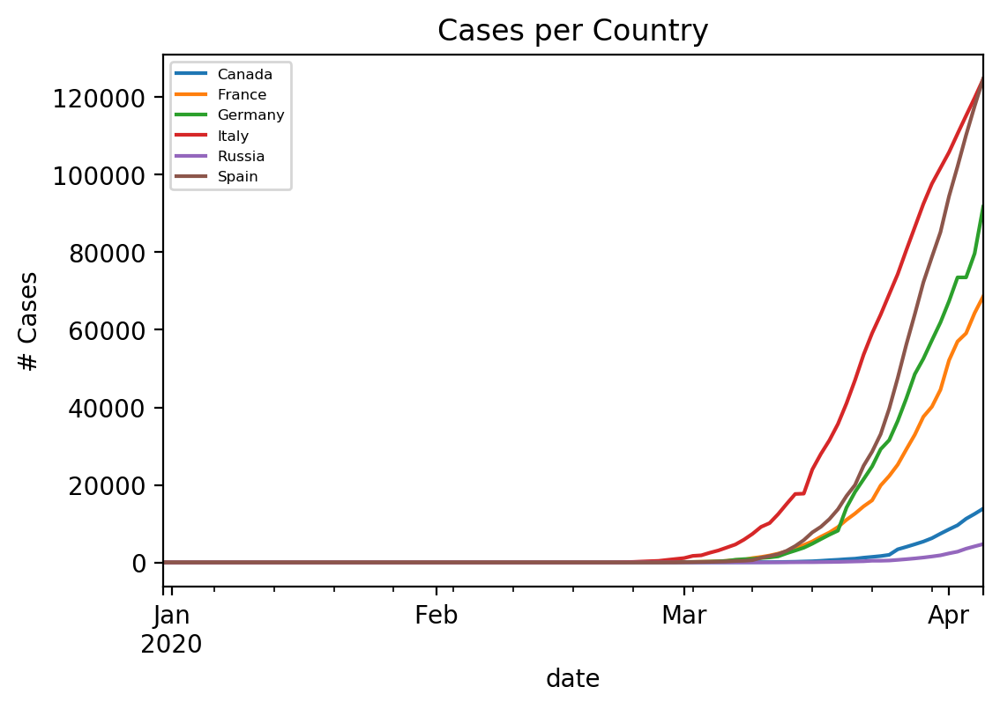

In [60]:
# select a few countries and plot their cumulative cases

locs = ["Canada", "Germany", "France", "Russia", "Italy", "Spain"]
x = cum_covid_df[cum_covid_df.location.isin(locs)]

fig, ax = plt.subplots()

for key, grp in x.groupby(['location']):
    ax = grp.plot(ax=ax, kind='line', x='date', y='cases', label=key)

plt.title("Cases per Country")
plt.ylabel("# Cases")
plt.legend(loc='best', prop={'size': 6})
plt.show()

OK, now let's do # of cases since 100th case

In [83]:
# find the date at which the 100th case occurs for each country
y = cum_covid_df[cum_covid_df.cases >= 100].groupby('location').agg({
    'date': 'min'
}).reset_index().set_index(['location', 'date'])
#.rename(columns={
#    'date': 'date_100th_case'
#}).set_index('location')
y

,
location,date
Afghanistan,2020-03-29
Albania,2020-03-24
Algeria,2020-03-23
Andorra,2020-03-23
Argentina,2020-03-20
...,...
United_States_of_America,2020-03-03
Uruguay,2020-03-21
Uzbekistan,2020-03-28


In [92]:
# out of curiosity what number does this correspond to for each country
j = cum_covid_df.set_index(['location', 'date']).join(y, how='right')
#j[j.cases < 100]
j

,,cases,deaths
location,date,,
Afghanistan,2020-03-29,106,3
Albania,2020-03-24,100,4
Algeria,2020-03-23,102,15
Andorra,2020-03-23,113,0
Argentina,2020-03-20,128,3
Armenia,2020-03-19,115,0
Australia,2020-03-10,100,3
Austria,2020-03-09,102,0
Azerbaijan,2020-03-27,122,3


In [96]:
# alright now we can calculate days since 100th case
# here is our lookup table
c_case_date = y.reset_index().set_index('location').to_dict()['date']
c_case_date

{'Afghanistan': Timestamp('2020-03-29 00:00:00'),
 'Albania': Timestamp('2020-03-24 00:00:00'),
 'Algeria': Timestamp('2020-03-23 00:00:00'),
 'Andorra': Timestamp('2020-03-23 00:00:00'),
 'Argentina': Timestamp('2020-03-20 00:00:00'),
 'Armenia': Timestamp('2020-03-19 00:00:00'),
 'Australia': Timestamp('2020-03-10 00:00:00'),
 'Austria': Timestamp('2020-03-09 00:00:00'),
 'Azerbaijan': Timestamp('2020-03-27 00:00:00'),
 'Bahrain': Timestamp('2020-03-10 00:00:00'),
 'Belarus': Timestamp('2020-03-31 00:00:00'),
 'Belgium': Timestamp('2020-03-07 00:00:00'),
 'Bolivia': Timestamp('2020-03-31 00:00:00'),
 'Bosnia_and_Herzegovina': Timestamp('2020-03-23 00:00:00'),
 'Brazil': Timestamp('2020-03-15 00:00:00'),
 'Brunei_Darussalam': Timestamp('2020-03-25 00:00:00'),
 'Bulgaria': Timestamp('2020-03-20 00:00:00'),
 'Burkina_Faso': Timestamp('2020-03-26 00:00:00'),
 'Cambodia': Timestamp('2020-03-28 00:00:00'),
 'Cameroon': Timestamp('2020-03-31 00:00:00'),
 'Canada': Timestamp('2020-03-12 00:0

In [99]:
def get_days_since_100th_case(row):
    try:
        d = c_case_date[row.location]
        delta = (row.date - d).days
        return delta
    except KeyError:
        # haven't had 100 cases yet
        return pd.NA
    

cum_covid_df['days_since_100th_case'] = cum_covid_df.apply(get_days_since_100th_case, axis=1)

In [100]:
cum_covid_df

,location,cases,deaths,date,days_since_100th_case
0,Georgia,0,0,2019-12-31,-92
1,Israel,0,0,2019-12-31,-74
2,Qatar,0,0,2019-12-31,-72
3,Belgium,0,0,2019-12-31,-67
4,Singapore,0,0,2019-12-31,-61
...,...,...,...,...,...
8900,Dominica,14,0,2020-04-05,<NA>
8901,Japan,3271,70,2020-04-05,43
8902,Portugal,10524,266,2020-04-05,22
8903,Australia,5687,34,2020-04-05,26


In [101]:
cum_covid_df[cum_covid_df.location == 'Canada']

,location,cases,deaths,date,days_since_100th_case
39,Canada,0,0,2019-12-31,-72
101,Canada,0,0,2020-01-01,-71
160,Canada,0,0,2020-01-02,-70
255,Canada,0,0,2020-01-03,-69
302,Canada,0,0,2020-01-04,-68
358,Canada,0,0,2020-01-05,-67
464,Canada,0,0,2020-01-06,-66
490,Canada,0,0,2020-01-07,-65
563,Canada,0,0,2020-01-08,-64
634,Canada,0,0,2020-01-09,-63


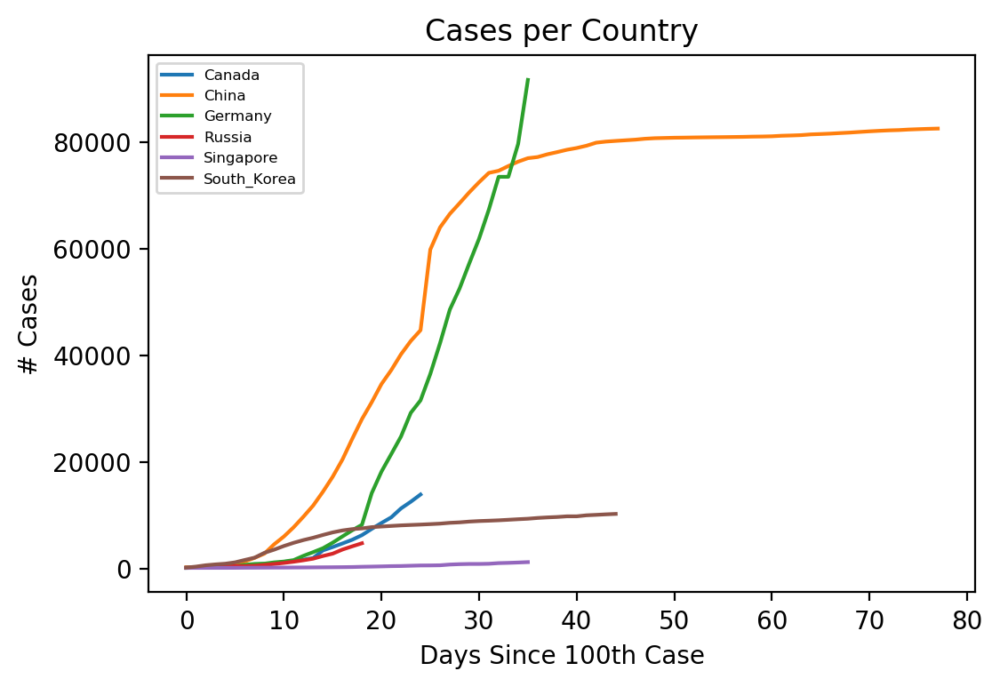

In [129]:
# finally plot

# locs = ["Canada", "Germany", "France", "Russia", "Italy", "Spain"]
locs = ["Canada", "Germany", "South_Korea", "China", "Russia", "Singapore"]
x = cum_covid_df[(cum_covid_df.location.isin(locs)) & (cum_covid_df.days_since_100th_case >= 0)]

fig, ax = plt.subplots()

for key, grp in x.groupby(['location']):
    ax = grp.plot(ax=ax, kind='line', x='days_since_100th_case', y='cases', label=key)

plt.title("Cases per Country")
plt.ylabel("# Cases")
plt.xlabel('Days Since 100th Case')
plt.legend(loc='best', prop={'size': 6})
plt.show()

### insert population data -> cases per 1k capita

In [113]:
popData = covid_df[['countriesAndTerritories', 'popData2018']].drop_duplicates().set_index('countriesAndTerritories').to_dict()['popData2018']
popData

{'Afghanistan': 37172386.0,
 'Albania': 2866376.0,
 'Andorra': 77006.0,
 'Algeria': 42228429.0,
 'Angola': 30809762.0,
 'Anguilla': nan,
 'Antigua_and_Barbuda': 96286.0,
 'Argentina': 44494502.0,
 'Armenia': 2951776.0,
 'Aruba': 105845.0,
 'Australia': 24992369.0,
 'Austria': 8847037.0,
 'Azerbaijan': 9942334.0,
 'Bahamas': 385640.0,
 'Bahrain': 1569439.0,
 'Bangladesh': 161356039.0,
 'Barbados': 286641.0,
 'Belarus': 9485386.0,
 'Belgium': 11422068.0,
 'Belize': 383071.0,
 'Benin': 11485048.0,
 'Bermuda': 63968.0,
 'Bhutan': 754394.0,
 'Bolivia': 11353142.0,
 'Bonaire, Saint Eustatius and Saba': nan,
 'Bosnia_and_Herzegovina': 3323929.0,
 'Botswana': 2254126.0,
 'Brazil': 209469333.0,
 'British_Virgin_Islands': 29802.0,
 'Brunei_Darussalam': 428962.0,
 'Bulgaria': 7024216.0,
 'Burkina_Faso': 19751535.0,
 'Burundi': 11175378.0,
 'Cambodia': 16249798.0,
 'Cameroon': 25216237.0,
 'Canada': 37058856.0,
 'Cape_Verde': 543767.0,
 'Cases_on_an_international_conveyance_Japan': 3000.0,
 'Cayma

In [114]:
def get_pop_data_2018(location: str) -> float:
    return popData[location]

cum_covid_df['popData2018'] = cum_covid_df['location'].apply(get_pop_data_2018)

In [117]:
cum_covid_df['cases_per_1k_pop'] = cum_covid_df.cases / (cum_covid_df.popData2018 / 1000)

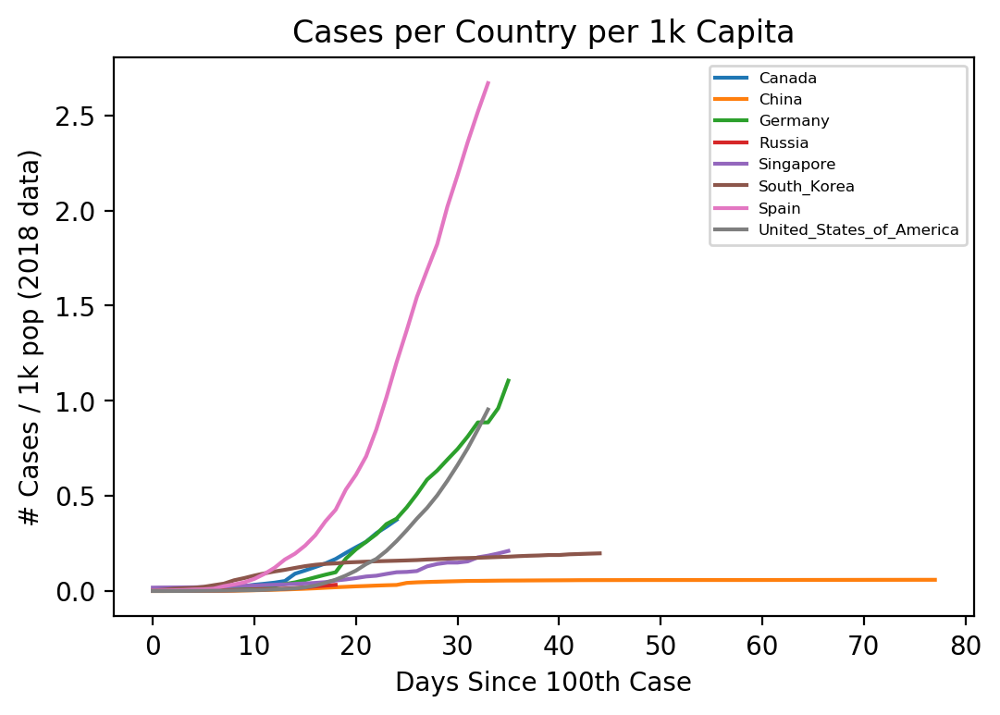

In [130]:
# alright now it's time for that population plot

# locs = ["Canada", "Germany", "France", "Russia", "Italy", "Spain", "United_States_of_America", "United_Kingdom"]
locs = ["Canada", "Germany", "China", "Russia", "South_Korea", "Spain", "United_States_of_America", "Singapore"]
x = cum_covid_df[(cum_covid_df.location.isin(locs)) & (cum_covid_df.days_since_100th_case >= 0)]

fig, ax = plt.subplots()

for key, grp in x.groupby(['location']):
    ax = grp.plot(ax=ax, kind='line', x='days_since_100th_case', y='cases_per_1k_pop', label=key)

plt.title("Cases per Country per 1k Capita")
plt.ylabel("# Cases / 1k pop (2018 data)")
plt.xlabel('Days Since 100th Case')
plt.legend(loc='best', prop={'size': 6})
plt.show()